In [2]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.signal import convolve2d
from skimage import io, color

# read the cameraman.png
image = io.imread('data/cameraman.png')
image.shape

(542, 540, 4)

<span style="font-size: 32px;">Part 1.1: Finite Difference Operator</span>

In [2]:
# in order to get gradient and edge of image,
# we don't need the last channel of 4 (alpha channel),
# so we get RGB channels only
image = image[:,:,:3]

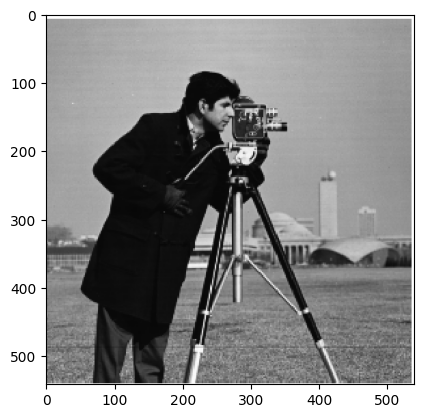

In [3]:
# show the original RGB image
plt.imshow(image[:,:,:3])
plt.show()

In [4]:
# translate into gray image
gray_image = color.rgb2gray(image)
gray_image

array([[1.       , 1.       , 1.       , ..., 1.       , 1.       ,
        1.       ],
       [1.       , 1.       , 1.       , ..., 1.       , 1.       ,
        1.       ],
       [1.       , 1.       , 1.       , ..., 1.       , 1.       ,
        1.       ],
       ...,
       [1.       , 0.4745098, 0.4745098, ..., 1.       , 1.       ,
        1.       ],
       [1.       , 0.4745098, 0.4745098, ..., 1.       , 1.       ,
        1.       ],
       [1.       , 1.       , 1.       , ..., 1.       , 1.       ,
        1.       ]])

In [5]:
# define Dx and Dy
Dx = np.array([[-1, 0, 1]])
Dy = np.array([[-1], [0], [1]])

# compute gradients of x and y
gradient_x = convolve2d(gray_image, Dx, mode='same')
gradient_y = convolve2d(gray_image, Dy, mode='same')
print(gradient_x)

[[-1.          0.          0.         ...  0.          0.
   1.        ]
 [-1.          0.          0.         ...  0.          0.
   1.        ]
 [-1.          0.          0.         ...  0.          0.
   1.        ]
 ...
 [-0.4745098   0.5254902  -0.01960784 ...  0.          0.
   1.        ]
 [-0.4745098   0.5254902  -0.01960784 ...  0.          0.
   1.        ]
 [-1.          0.          0.         ...  0.          0.
   1.        ]]


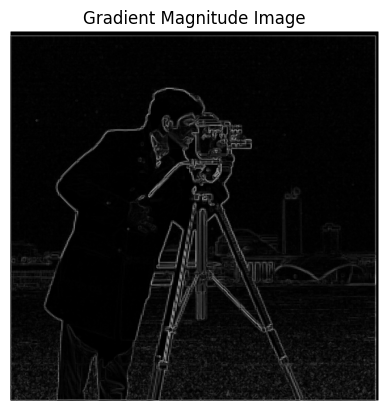

In [6]:
# merge gradient x and y into gradient magnitude image
gradient_magnitude = np.sqrt(gradient_x**2 + gradient_y**2)
# show the gradient magnitude image
plt.imshow(gradient_magnitude, cmap='gray')
plt.title('Gradient Magnitude Image')
plt.axis('off')
plt.savefig("result/part1.1/gradient_manitude_image.jpg")
plt.show()

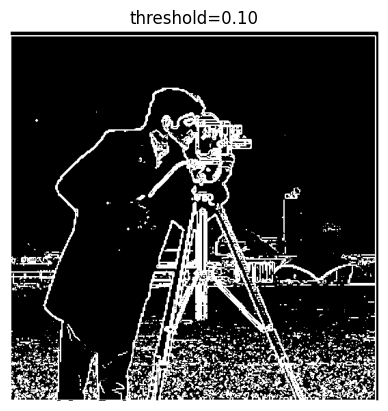

In [11]:
# set threshold
threshold = 0.1
# binarize the gradient magnitude image
edge_image = np.where(gradient_magnitude > threshold, 1, 0)

# show edge image
plt.imshow(edge_image, cmap='gray')
plt.title('threshold=0.10')
plt.axis('off')
plt.savefig("result/part1.1/edge_0_10_image.jpg")
plt.show()

<span style="font-size: 32px;">Part 1.2: Derivative of Gaussian (DoG) Filter</span>

In [46]:
import cv2

# create a 1D gaussian filter using getGaussianKernel
gaussian_kernel_1d = cv2.getGaussianKernel(ksize=5, sigma=1)
print("gaussian kernel 1d: \n", gaussian_kernel_1d)
print()

# 2D guassian filter = 1D outer 1D.T
gaussian_kernel_2d = np.outer(gaussian_kernel_1d, gaussian_kernel_1d)
print("gaussian kernel 2d: \n", gaussian_kernel_2d)

gaussian kernel 1d: 
 [[0.05448868]
 [0.24420134]
 [0.40261995]
 [0.24420134]
 [0.05448868]]

gaussian kernel 2d: 
 [[0.00296902 0.01330621 0.02193823 0.01330621 0.00296902]
 [0.01330621 0.0596343  0.09832033 0.0596343  0.01330621]
 [0.02193823 0.09832033 0.16210282 0.09832033 0.02193823]
 [0.01330621 0.0596343  0.09832033 0.0596343  0.01330621]
 [0.00296902 0.01330621 0.02193823 0.01330621 0.00296902]]


In [47]:
# blur the gray_image using gaussian kernel 2d
blurred_image = convolve2d(gray_image, gaussian_kernel_2d, mode='same')

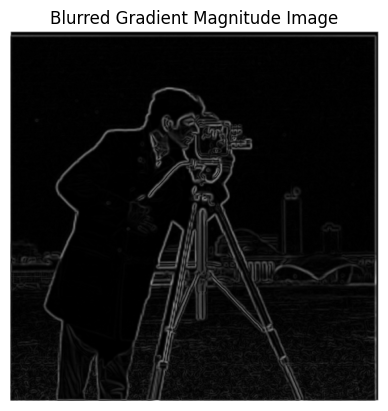

In [48]:
# now we repeat the procedure in part 1.1
gradient_x = convolve2d(blurred_image, Dx, mode='same')
gradient_y = convolve2d(blurred_image, Dy, mode='same')
# merge gradient x and y into gradient magnitude image
gradient_magnitude = np.sqrt(gradient_x**2 + gradient_y**2)
# show the gradient magnitude image
plt.imshow(gradient_magnitude, cmap='gray')
plt.title('Blurred Gradient Magnitude Image')
plt.axis('off')
plt.savefig("result/part1.2/blurred_gradient_manitude_image.jpg")
plt.show()

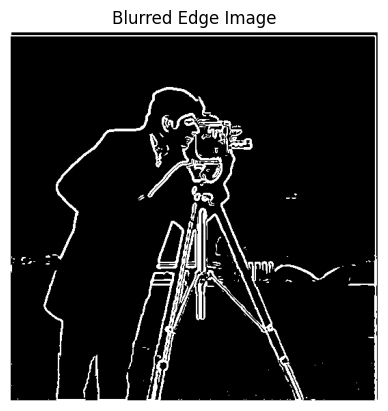

In [49]:
# set threshold
threshold = 0.15
# binarize the gradient magnitude image
edge_image = np.where(gradient_magnitude > threshold, 1, 0)

# show edge image
plt.imshow(edge_image, cmap='gray')
plt.title('Blurred Edge Image')
plt.axis('off')
plt.savefig("result/part1.2/blurred_edge_image.jpg")
plt.show()

<span style="font-size: 32px;">Part 2.1: Image "Sharpening"</span>

In [24]:
import cv2
origin_image = cv2.imread('data/taj.jpg')
origin_image.shape

(300, 300, 3)

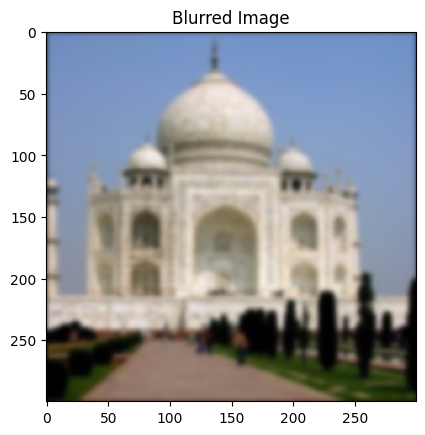

True

In [31]:
# split the channel
b, g, r = cv2.split(origin_image)

# define the 2D guassian filter
gaussian_kernel_1d = cv2.getGaussianKernel(ksize=12, sigma=2)
gaussian_kernel_2d = np.outer(gaussian_kernel_1d, gaussian_kernel_1d)

# get blur version of each channel using 2D guassian filter
b_blur = convolve2d(b, gaussian_kernel_2d, mode='same')
g_blur = convolve2d(g, gaussian_kernel_2d, mode='same')
r_blur = convolve2d(r, gaussian_kernel_2d, mode='same')

# blurred_image
blurred_image = cv2.merge([b_blur, g_blur, r_blur])
# cast into int8 type
blurred_image = np.clip(blurred_image, 0, 255).astype(np.uint8)

# for plt.imshow, we should merge in the way of RGB
plt_blurred_image = cv2.cvtColor(blurred_image, cv2.COLOR_BGR2RGB)

plt.imshow(plt_blurred_image)
plt.title('Blurred Image')
#plt.axis('off')
plt.show()

cv2.imwrite("result/part2.1/blurred_image.jpg", blurred_image)

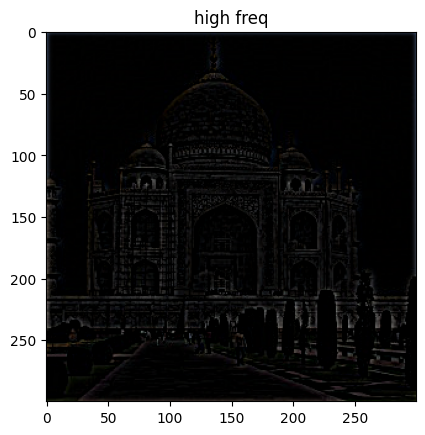

True

In [32]:
# high freq = origin image - blurred image
high_freq = cv2.subtract(origin_image , blurred_image)

plt_high_freq = cv2.cvtColor(high_freq, cv2.COLOR_BGR2RGB)

plt.imshow(plt_high_freq)
plt.title('high freq')
#plt.axis('off')
plt.show()

cv2.imwrite("result/part2.1/high_freq.jpg", high_freq)

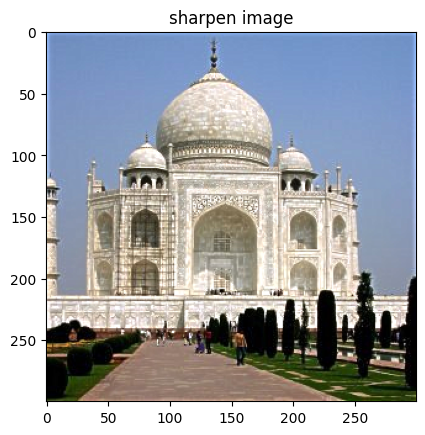

True

In [33]:
# sharpen image = origin image + high freq
sharpen_image = cv2.add(origin_image , high_freq)

plt_sharpen = cv2.cvtColor(sharpen_image, cv2.COLOR_BGR2RGB)

plt.imshow(plt_sharpen)
plt.title('sharpen image')
#plt.axis('off')
plt.show()

cv2.imwrite("result/part2.1/sharpen_image.jpg", sharpen_image)

Evaluation image:

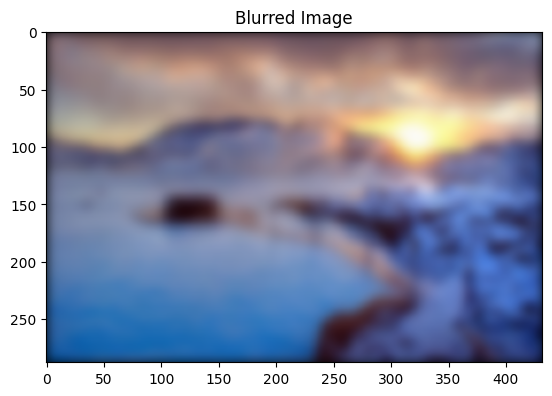

True

In [47]:
origin_image = cv2.imread('data/iceland.jpg')

gaussian_kernel_1d = cv2.getGaussianKernel(ksize=30, sigma=5)
gaussian_kernel_2d = np.outer(gaussian_kernel_1d, gaussian_kernel_1d)

b, g, r = cv2.split(origin_image)
b_blur = convolve2d(b, gaussian_kernel_2d, mode='same')
g_blur = convolve2d(g, gaussian_kernel_2d, mode='same')
r_blur = convolve2d(r, gaussian_kernel_2d, mode='same')

blurred_image = cv2.merge([b_blur, g_blur, r_blur])
blurred_image = np.clip(blurred_image, 0, 255).astype(np.uint8)
plt_blurred_image = cv2.cvtColor(blurred_image, cv2.COLOR_BGR2RGB)

plt.imshow(plt_blurred_image)
plt.title('Blurred Image')
plt.show()

cv2.imwrite("result/part2.1/blurred_iceland.jpg", blurred_image)

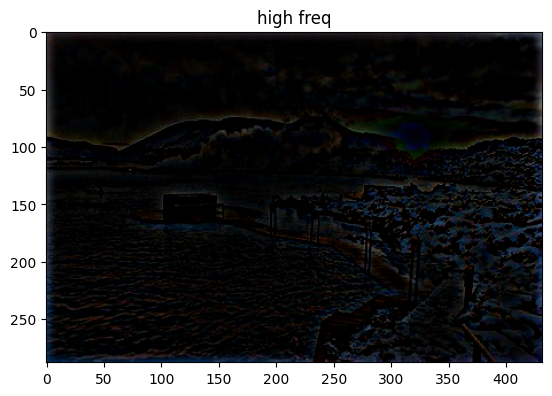

True

In [48]:
high_freq = cv2.subtract(origin_image , blurred_image)
plt_high_freq = cv2.cvtColor(high_freq, cv2.COLOR_BGR2RGB)
plt.imshow(plt_high_freq)
plt.title('high freq')
#plt.axis('off')
plt.show()
cv2.imwrite("result/part2.1/high_freq_iceland.jpg", high_freq)

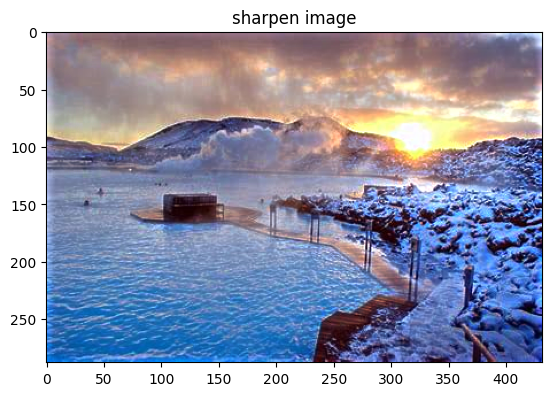

True

In [49]:
sharpen_image = cv2.add(origin_image , high_freq)

plt_sharpen = cv2.cvtColor(sharpen_image, cv2.COLOR_BGR2RGB)

plt.imshow(plt_sharpen)
plt.title('sharpen image')
#plt.axis('off')
plt.show()

cv2.imwrite("result/part2.1/sharpen_image_iceland.jpg", sharpen_image)

<span style="font-size: 32px;">Part 2.2: Hybrid Images</span>

First, we need to align the images using start code provided.

In [1]:
import cv2
import math
import numpy as np
%config InlineBackend.figure_format = 'retina'
import matplotlib.pyplot as plt
import skimage.transform as sktr

def get_points(im1, im2):
    print('Please select 2 points in each image for alignment.')
    plt.imshow(im1)
    p1, p2 = plt.ginput(2)
    plt.close()
    plt.imshow(im2)
    p3, p4 = plt.ginput(2)
    plt.close()
    return (p1, p2, p3, p4)

def recenter(im, r, c):
    R, C, _ = im.shape
    rpad = (int) (np.abs(2*r+1 - R))
    cpad = (int) (np.abs(2*c+1 - C))
    return np.pad(
        im, [(0 if r > (R-1)/2 else rpad, 0 if r < (R-1)/2 else rpad),
             (0 if c > (C-1)/2 else cpad, 0 if c < (C-1)/2 else cpad),
             (0, 0)], 'constant')

def find_centers(p1, p2):
    cx = np.round(np.mean([p1[0], p2[0]]))
    cy = np.round(np.mean([p1[1], p2[1]]))
    return cx, cy

def align_image_centers(im1, im2, pts):
    p1, p2, p3, p4 = pts
    h1, w1, b1 = im1.shape
    h2, w2, b2 = im2.shape
    
    cx1, cy1 = find_centers(p1, p2)
    cx2, cy2 = find_centers(p3, p4)

    im1 = recenter(im1, cy1, cx1)
    im2 = recenter(im2, cy2, cx2)
    return im1, im2

def rescale_images(im1, im2, pts):
    p1, p2, p3, p4 = pts
    len1 = np.sqrt((p2[1] - p1[1])**2 + (p2[0] - p1[0])**2)
    len2 = np.sqrt((p4[1] - p3[1])**2 + (p4[0] - p3[0])**2)
    dscale = len2/len1
    if dscale < 1:
        im1 = sktr.rescale(im1, dscale)
    else:
        im2 = sktr.rescale(im2, 1./dscale)
    return im1, im2

def rotate_im1(im1, im2, pts):
    p1, p2, p3, p4 = pts
    theta1 = math.atan2(-(p2[1] - p1[1]), (p2[0] - p1[0]))
    theta2 = math.atan2(-(p4[1] - p3[1]), (p4[0] - p3[0]))
    dtheta = theta2 - theta1
    im1 = sktr.rotate(im1, dtheta*180/np.pi)
    return im1, dtheta

def match_img_size(im1, im2):
    # Make images the same size
    h1, w1, c1 = im1.shape
    h2, w2, c2 = im2.shape
    if h1 < h2:
        im2 = im2[int(np.floor((h2-h1)/2.)) : -int(np.ceil((h2-h1)/2.)), :, :]
    elif h1 > h2:
        im1 = im1[int(np.floor((h1-h2)/2.)) : -int(np.ceil((h1-h2)/2.)), :, :]
    if w1 < w2:
        im2 = im2[:, int(np.floor((w2-w1)/2.)) : -int(np.ceil((w2-w1)/2.)), :]
    elif w1 > w2:
        im1 = im1[:, int(np.floor((w1-w2)/2.)) : -int(np.ceil((w1-w2)/2.)), :]
    assert im1.shape == im2.shape
    return im1, im2

def align_images(im1, im2):
    pts = get_points(im1, im2)
    im1, im2 = align_image_centers(im1, im2, pts)
    im1, im2 = rescale_images(im1, im2, pts)
    im1, angle = rotate_im1(im1, im2, pts)
    im1, im2 = match_img_size(im1, im2)
    return im1, im2

In [14]:
# load the pair of images (take human and cat as example)
#human = cv2.imread("hybrid_python/ex2.jpg")/255
#cat = cv2.imread("hybrid_python/ex1.jpg")/255

human = io.imread("data/dog.bmp")/255
cat = io.imread("data/cat.bmp")/255

In [4]:
def gaussian_blur(image, ksize, sigma):
    # split the channel
    r, g, b = cv2.split(image)

    # define the 2D guassian filter
    gaussian_kernel_1d = cv2.getGaussianKernel(ksize=ksize, sigma=sigma)
    gaussian_kernel_2d = np.outer(gaussian_kernel_1d, gaussian_kernel_1d)

    # get blur version of each channel using 2D guassian filter
    b_blur = convolve2d(b, gaussian_kernel_2d, mode='same')
    g_blur = convolve2d(g, gaussian_kernel_2d, mode='same')
    r_blur = convolve2d(r, gaussian_kernel_2d, mode='same')

    # blurred_image
    blurred_image = cv2.merge([r_blur, g_blur, b_blur])

    return blurred_image

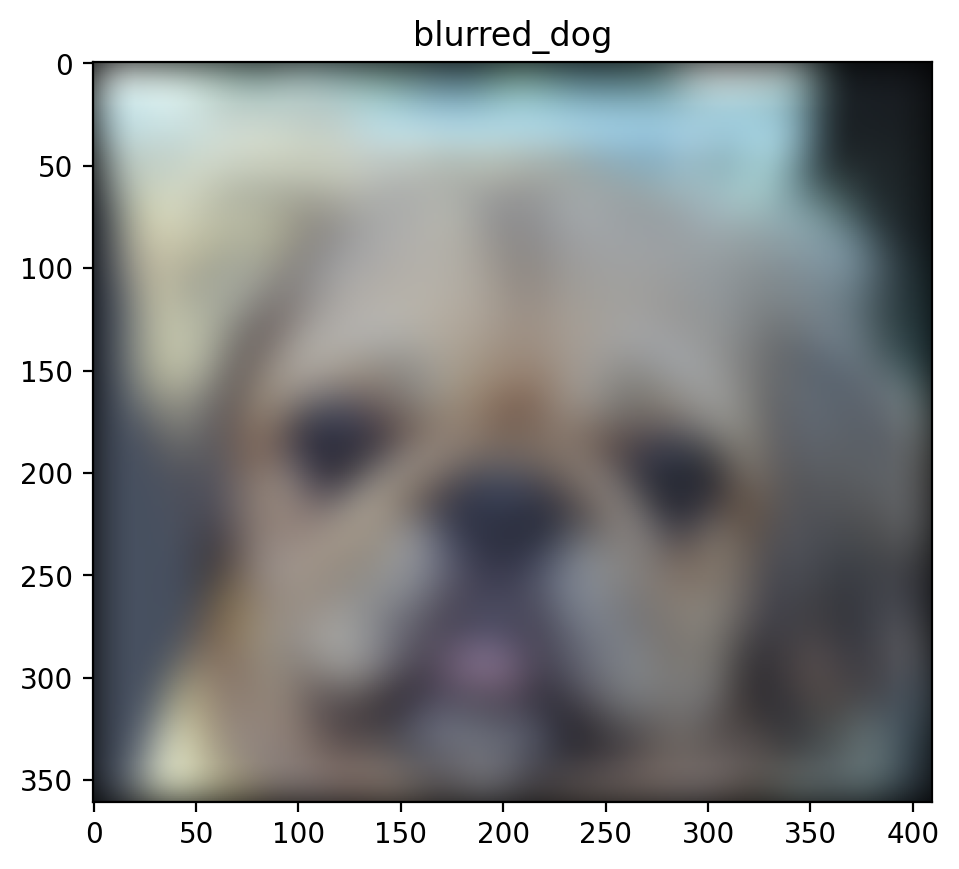

In [15]:
low_image = gaussian_blur(human, 40 , 10)

plt_low_image = low_image * 255
plt_low_image = np.clip(plt_low_image, 0, 255).astype(np.uint8)
plt.title('blurred_dog')
plt.imshow(plt_low_image)
plt.savefig("result/part2.2/blurred_dog.jpg")
plt.show()

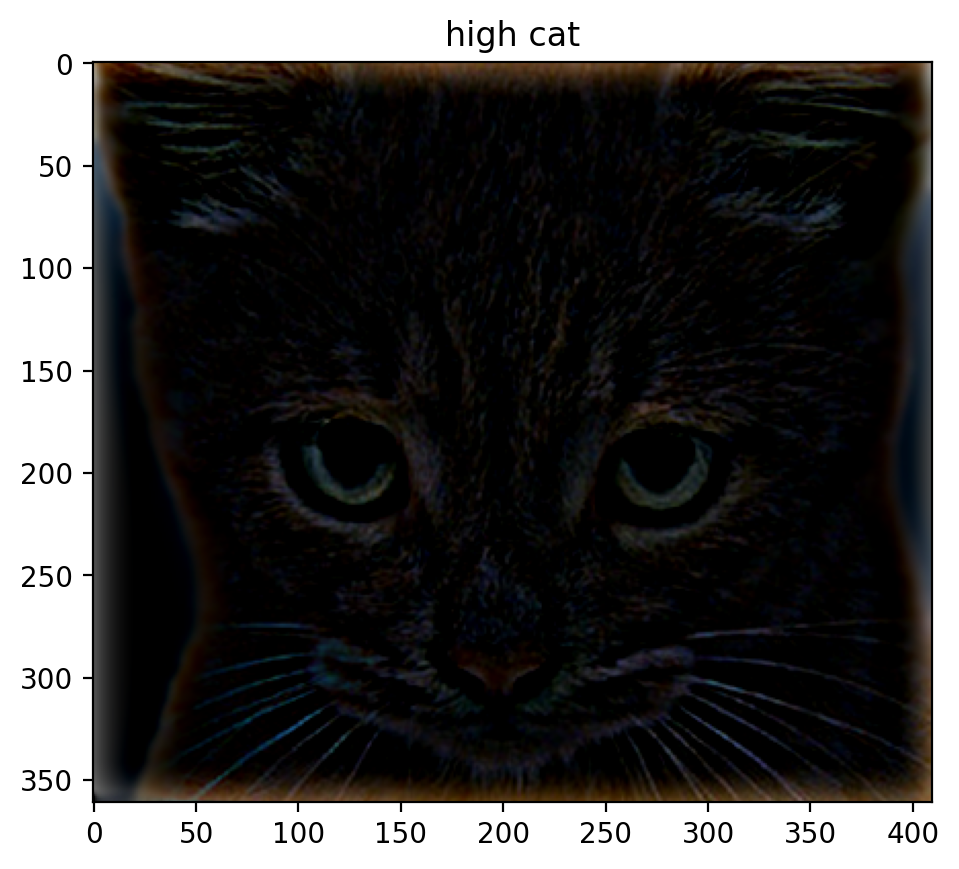

In [17]:
blurred_image = gaussian_blur(cat, 40 , 10)
highpass = cv2.subtract(cat, blurred_image)
plt_high_image = highpass * 255
plt_high_image = np.clip(plt_high_image, 0, 255).astype(np.uint8)
plt.title('high cat')
plt.imshow(plt_high_image)
plt.savefig("result/part2.2/high_cat.jpg")
plt.show()

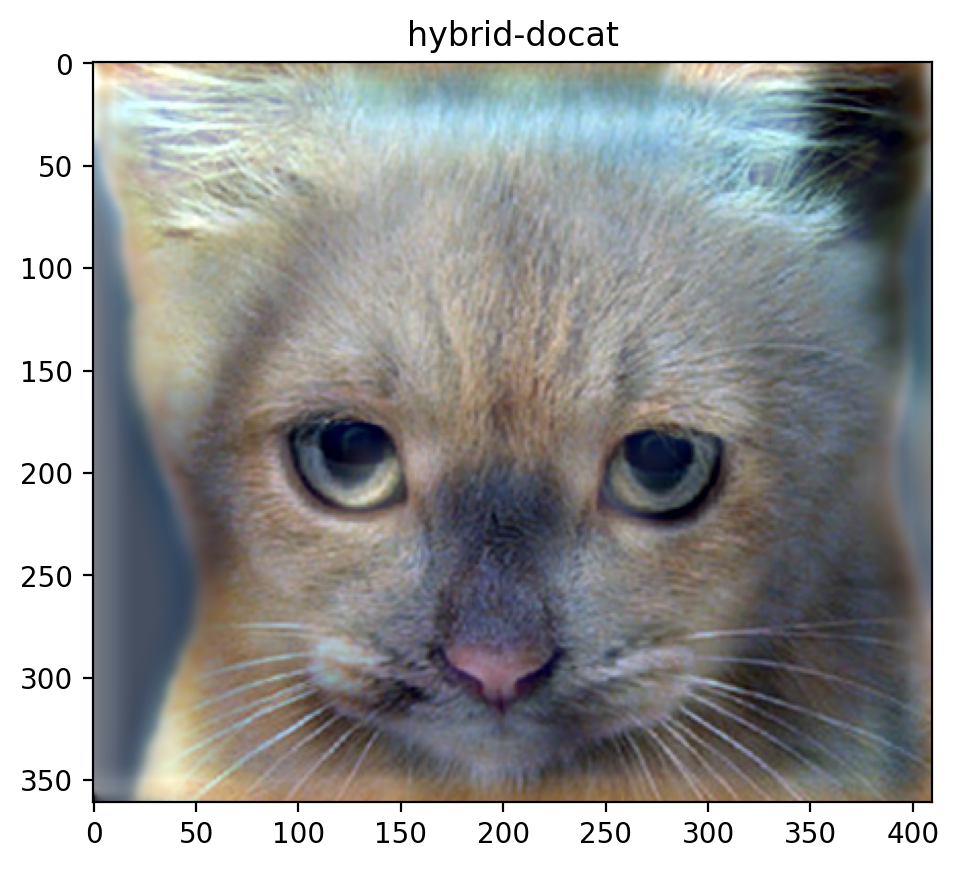

In [13]:
hybrid = low_image + highpass
hybrid = hybrid * 255
hybrid = np.clip(hybrid, 0, 255).astype(np.uint8)
plt.title('hybrid-docat')
plt.imshow(hybrid)
plt.savefig("result/part2.2/hybrid_docat.jpg")
plt.show()

In [3]:
def Lowpass_Filter(image, low_cutoff, ksize_forlow):
    # using guassian blur
    blurred_image = gaussian_blur(image, ksize_forlow , low_cutoff)    
    return blurred_image

def Impulse_Filter(image, high_cutoff):
    # using 
    impulsed_image = cv2.Laplacian(image, cv2.CV_32F)
    return impulsed_image

def Highpass_Filter(image, low_cutoff, ksize_forhigh , mode=1):
    #mode 1: highpass = origin - lowpass
    #mode 2: highpass = Impulse_Filter(origin) - lowpass
    
    blurred_image = gaussian_blur(image, ksize_forhigh , low_cutoff)
    
    if(mode == 2):
        impulsed_image = Impulse_Filter(image)
        highpass = cv2.subtract(impulsed_image, blurred_image)
        #sharpen_image = cv2.add(image, highpass)
        return highpass
    elif(mode == 1):
        highpass = cv2.subtract(image, blurred_image)
        return highpass
    else:
        print("wrong mode: ", mode)
        return None
    
def hybrid_image(low_image, high_image, freq_forlow, freq_forhigh, \
                 ksize_forlow = 15, ksize_forhigh = 15, mode=1):
    # blurred_image
    blurred_image = Lowpass_Filter(low_image, freq_forlow, ksize_forlow)
    
    # sharpen_image
    sharpen_image = Highpass_Filter(high_image, freq_forhigh, ksize_forhigh, mode)
    
    # hybrid_image
    hybrid_image = cv2.add(blurred_image, sharpen_image)

    return hybrid_image

In [72]:
hybrid = hybrid_image(human, cat, 10, 10, 21, 21, 1)
hybrid = hybrid * 255
hybrid = np.clip(hybrid, 0, 255).astype(np.uint8)

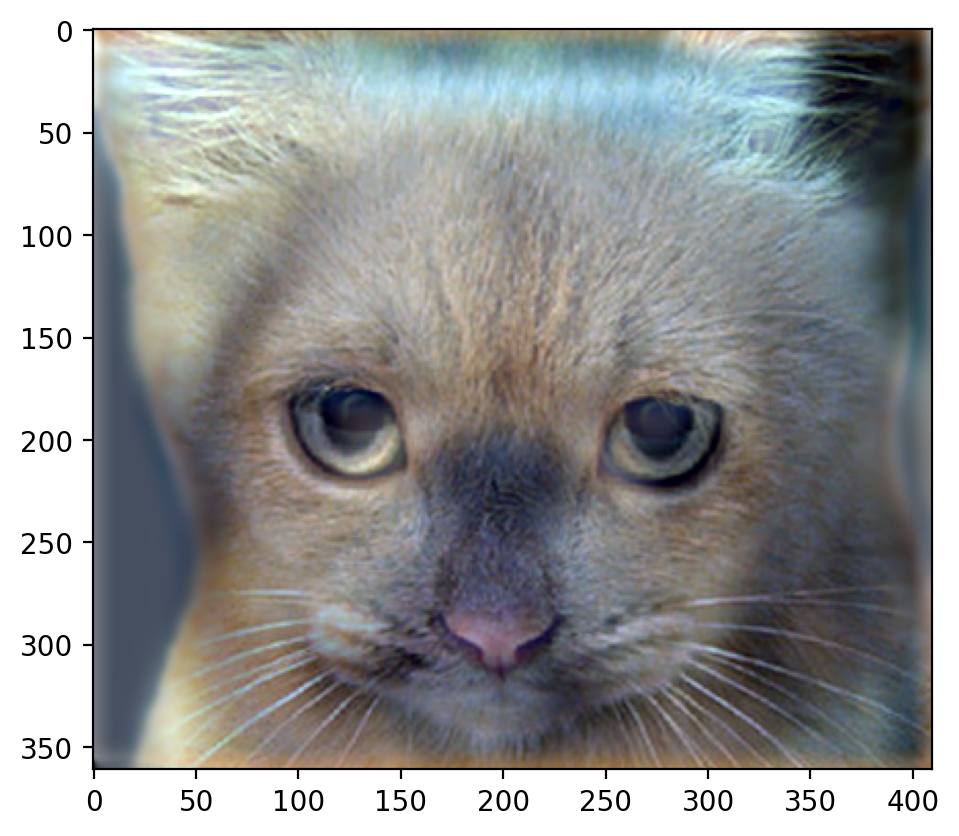

In [73]:
plt.imshow(hybrid)
plt.show()

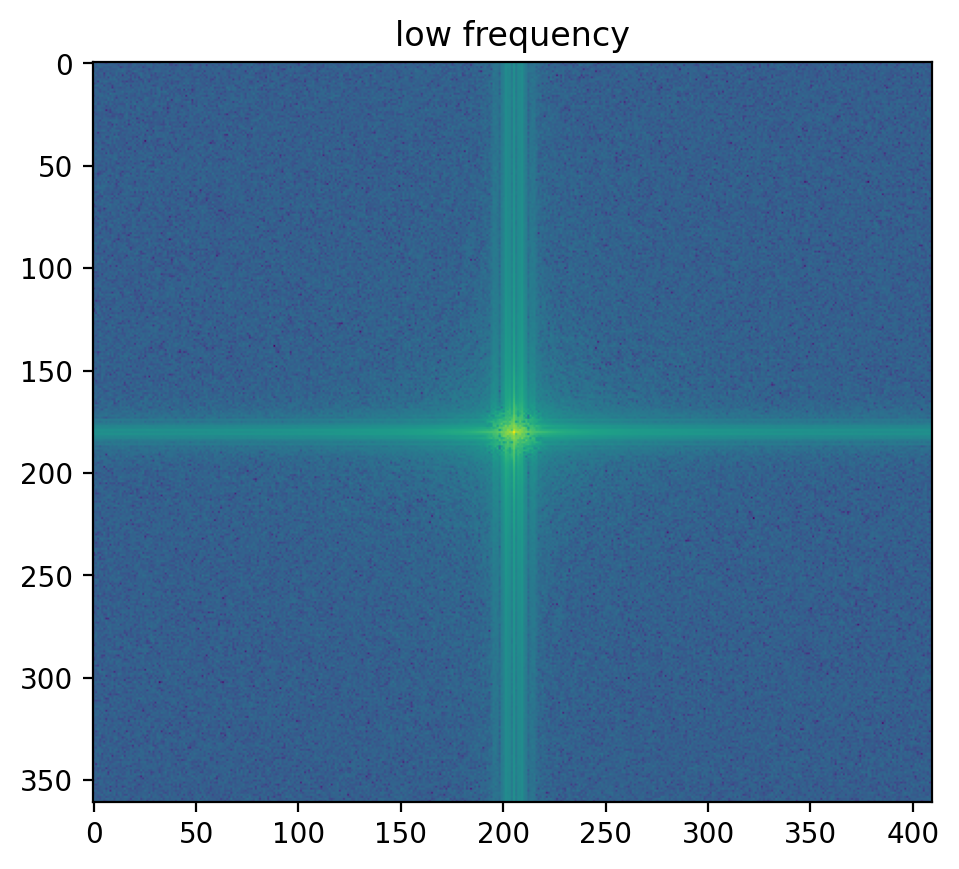

In [19]:
low_gray_image = cv2.cvtColor(plt_low_image, cv2.COLOR_RGB2GRAY)
plt.title('low frequency')
plt.imshow(np.log(np.abs(np.fft.fftshift(np.fft.fft2(low_gray_image)))))
plt.savefig("result/part2.2/low_frequency_analysis.jpg")
plt.show()

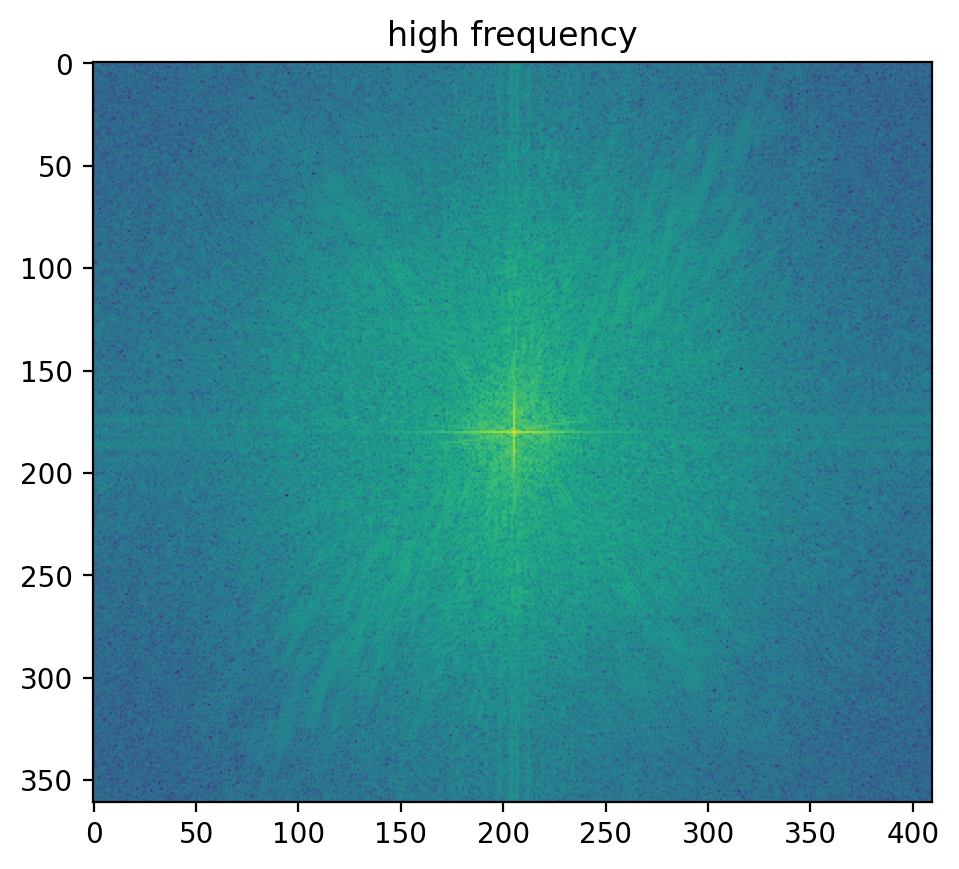

In [20]:
high_gray_image = cv2.cvtColor(plt_high_image, cv2.COLOR_RGB2GRAY)
plt.title('high frequency')
plt.imshow(np.log(np.abs(np.fft.fftshift(np.fft.fft2(high_gray_image)))))
plt.savefig("result/part2.2/high_frequency_analysis.jpg")
plt.show()

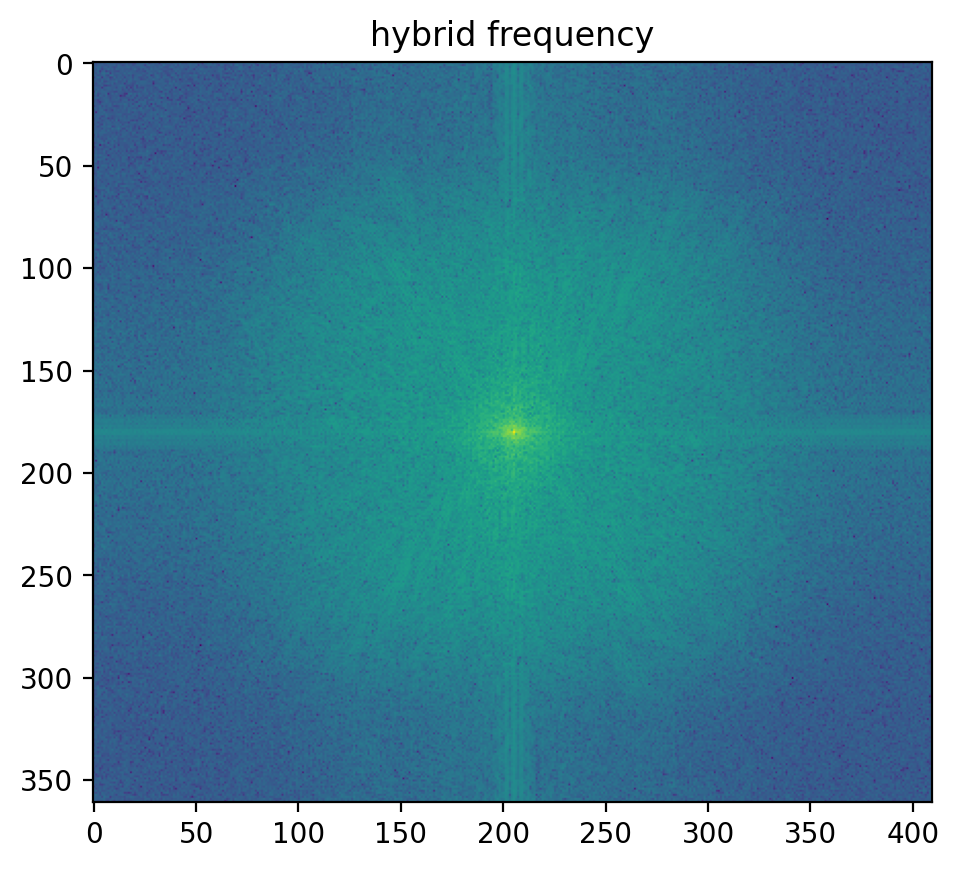

In [21]:
gray_image = cv2.cvtColor(hybrid, cv2.COLOR_RGB2GRAY)
plt.title('hybrid frequency')
plt.imshow(np.log(np.abs(np.fft.fftshift(np.fft.fft2(gray_image)))))
plt.savefig("result/part2.2/hybrid.jpg")
plt.show()

In [9]:
from skimage.transform import resize
from skimage import io, color
from scipy.signal import convolve2d

In [34]:
Trump = cv2.imread("data/Trump.jpg")
print(Trump.shape)
Biden = cv2.imread("data/Biden.jpg")
print(Biden.shape)

(632, 530, 3)
(701, 530, 3)


In [39]:
Biden_reshape = cv2.resize(Biden, (530, 632))
cv2.imwrite("data/Biden1.jpg", Biden_reshape)
cv2.imwrite("data/Trump1.jpg", Trump)

True

In [47]:
Trump = io.imread("data/aligned_Trump.jpg")/255
print(Trump.shape)
Biden = io.imread("data/aligned_Biden.jpg")/255
print(Biden.shape)

(645, 551, 3)
(645, 551, 3)


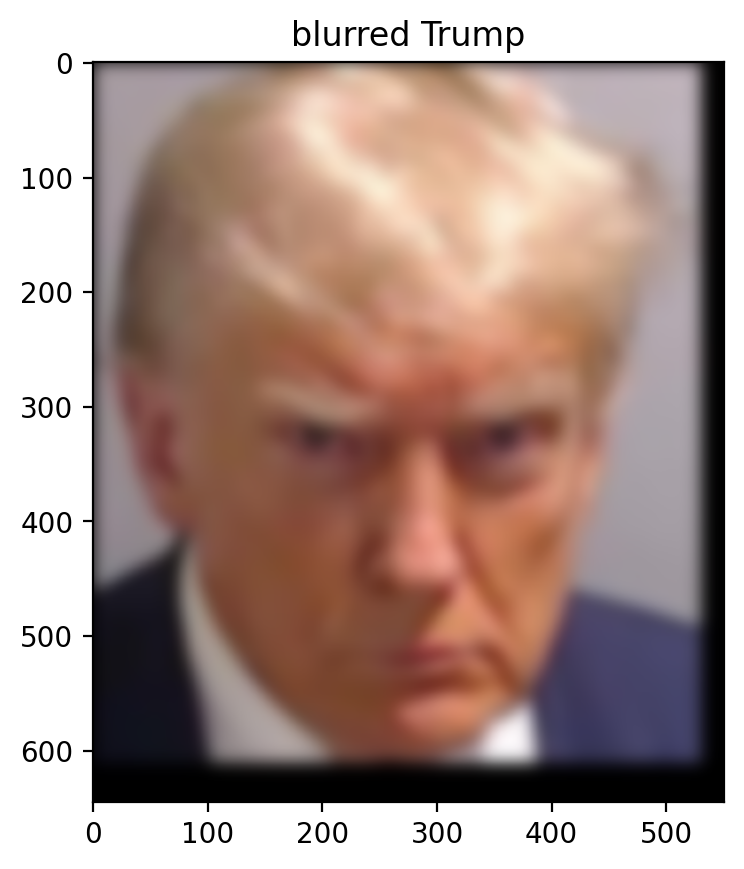

In [57]:
low_Trump = gaussian_blur(Trump, 42 , 7)

plt_low_Trump = low_Trump * 255
plt_low_Trump = np.clip(plt_low_Trump, 0, 255).astype(np.uint8)
plt.title('blurred Trump')
plt.imshow(plt_low_Trump)
plt.savefig("result/part2.2/blurred_Trump.jpg")
plt.show()

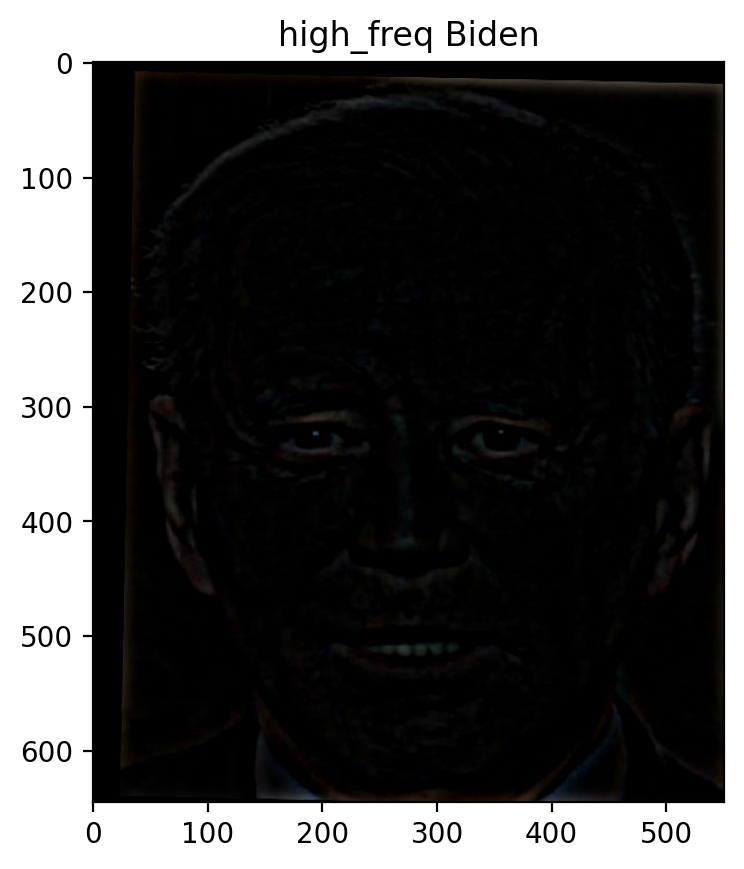

In [58]:
blurred_Biden = gaussian_blur(Biden, 42 , 7)
highpass = cv2.subtract(Biden, blurred_Biden)
plt_high_image = highpass * 255
plt_high_image = np.clip(plt_high_image, 0, 255).astype(np.uint8)
plt.title('high_freq Biden')
plt.imshow(plt_high_image)
plt.savefig("result/part2.2/high_freq_Biden.jpg")
plt.show()

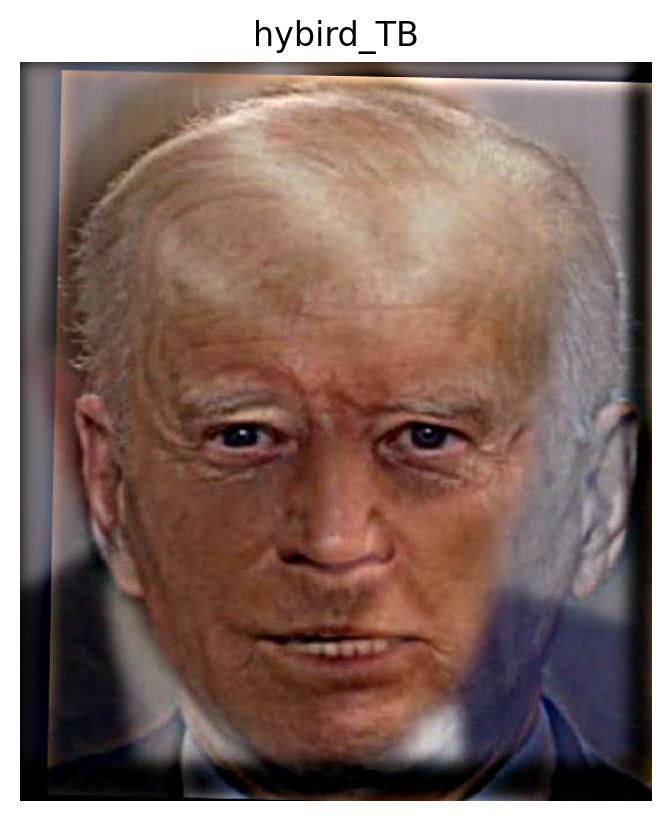

In [64]:
hybrid = 0.8 * low_Trump + 1.8 * highpass
hybrid = hybrid * 255
hybrid = np.clip(hybrid, 0, 255).astype(np.uint8)
plt.title('hybird_TB')
plt.imshow(hybrid)
plt.axis('off')
plt.savefig("result/part2.2/hybird_TB.jpg")
plt.show()

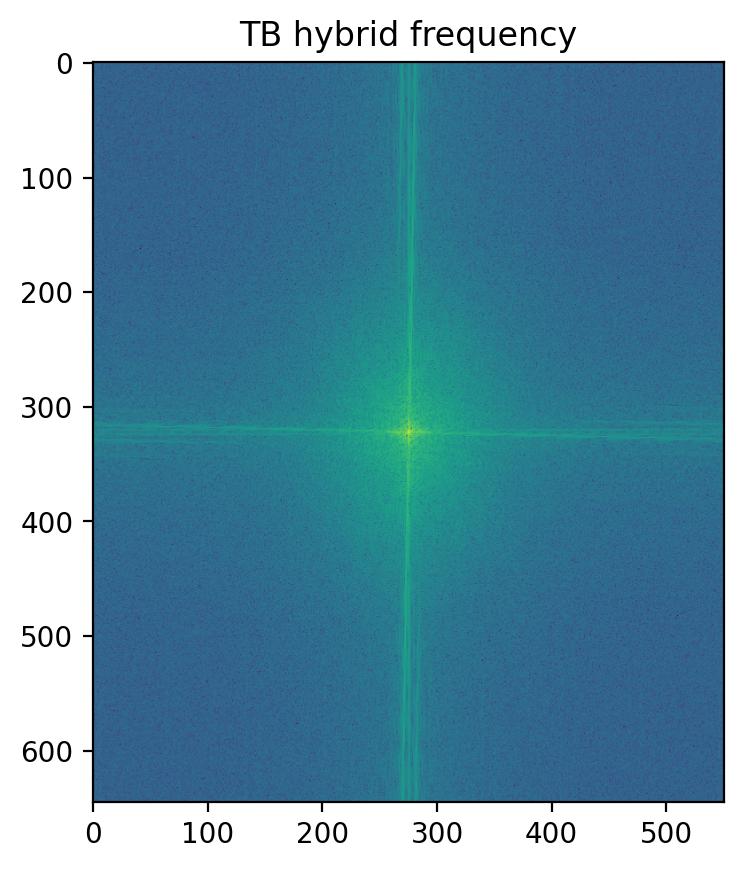

In [63]:
gray_image = cv2.cvtColor(hybrid, cv2.COLOR_RGB2GRAY)
plt.title('TB hybrid frequency')
plt.imshow(np.log(np.abs(np.fft.fftshift(np.fft.fft2(gray_image)))))
plt.savefig("result/part2.2/TB_hybrid_freq.jpg")
plt.show()

<span style="font-size: 32px;">Part 2.3: Gaussian and Laplacian Stacks</span>

In [65]:
import cv2
import copy

apple = io.imread("data/apple.jpeg")
orange = io.imread("data/orange.jpeg")

In [66]:
def gaussian_blur(image, ksize, sigma):
    # split the channel
    r, g, b = cv2.split(image)

    # define the 2D guassian filter
    gaussian_kernel_1d = cv2.getGaussianKernel(ksize=ksize, sigma=sigma)
    gaussian_kernel_2d = np.outer(gaussian_kernel_1d, gaussian_kernel_1d)

    # get blur version of each channel using 2D guassian filter
    b_blur = convolve2d(b, gaussian_kernel_2d, mode='same')
    g_blur = convolve2d(g, gaussian_kernel_2d, mode='same')
    r_blur = convolve2d(r, gaussian_kernel_2d, mode='same')

    # blurred_image
    blurred_image = cv2.merge([r_blur, g_blur, b_blur])

    return blurred_image

In [68]:
def smooth_interpolation(image, direction):
    
    return image
    
    width = image.shape[1]
    mask_width = width // 2
    
    # build a masked image
    mask = np.zeros((image.shape[0],mask_width), dtype=np.uint8)
    # generate masked area using smooth interpolation
    mask[:,:] = np.linspace(0, 255, mask_width)[np.newaxis, :]
    
    if(direction == "right"):
        result = np.concatenate((image[:,:mask_width,:], cv2.merge([mask,mask,mask])), axis=1)
    elif(direction == "left"):
        result = np.concatenate((cv2.merge([mask,mask,mask]),image[:,mask_width:,:]), axis=1)
    
    return result

In [69]:
apple = smooth_interpolation(apple, "right")/255
orange = smooth_interpolation(orange, "left")/255

In [70]:
def Gaussian_Stack(image, level, ksize, sigma):
    
    #level: the layers of pyramid
    #ksize: size of kernel
    #sigma: standard deviation of gaussian kernel
    
    #return Gaussian stack
    
    copy_image = copy.deepcopy(image)
    stack = []
    
    for i in range(level):
        blurred_image = gaussian_blur(copy_image, ksize, sigma)
        stack.append(blurred_image)
        copy_image = blurred_image
    
    return stack

def Laplacian_Stack(image, level, ksize, sigma):
    
    L_stack = []
    
    G_Stack = Gaussian_Stack(image, level, ksize, sigma)
    L_stack.append(cv2.subtract(image, G_Stack[0]))
    
    for i in range(level-1):
        high_freq = cv2.subtract(G_Stack[i], G_Stack[i+1])
        L_stack.append(high_freq)
        
    return L_stack

def Show_Stack(stack):
    length = len(stack)
    fig, axs = plt.subplots(1, length)
    
    for i in range(length):
        image = stack[i] * 255
        image = np.clip(image, 0, 255).astype(np.uint8)
        
        axs[i].imshow(image)
        axs[i].axis('off')
        axs[i].set_title(f"{i}")

    plt.tight_layout()

    plt.show()

In [71]:
apple_G_stack = Gaussian_Stack(apple, 4, 21, 10)
orange_G_stack = Gaussian_Stack(orange, 4, 21, 10)

apple_L_stack = Laplacian_Stack(apple, 4, 21, 10)
orange_L_stack = Laplacian_Stack(orange, 4, 21, 10)

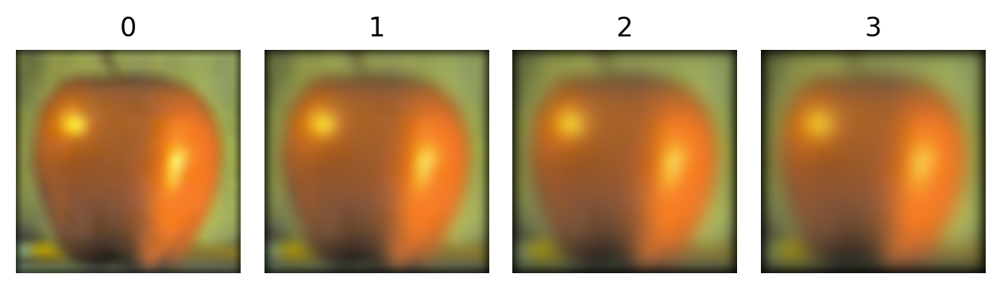

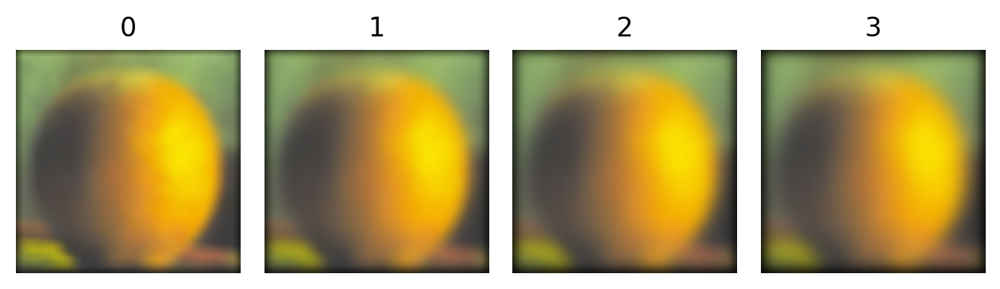

In [72]:
Show_Stack(apple_G_stack)
Show_Stack(orange_G_stack)

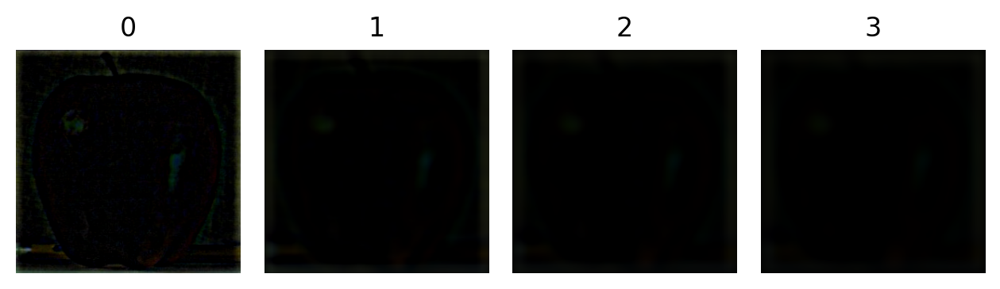

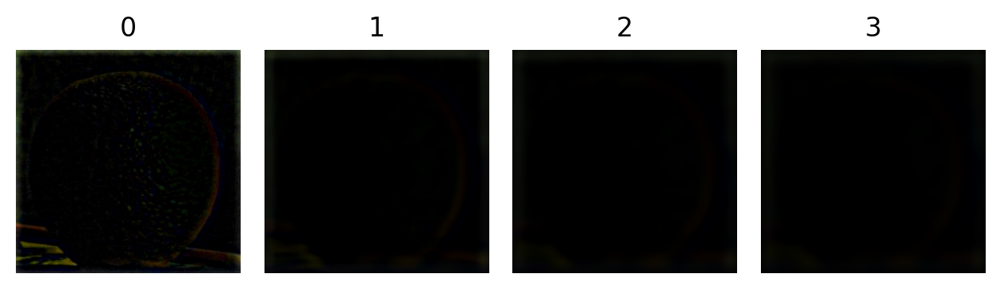

In [73]:
Show_Stack(apple_L_stack)
Show_Stack(orange_L_stack)

<span style="font-size: 32px;">Part 2.4: Multiresolution Blending (a.k.a. the oraple!)</span>

In [114]:
def merge_mask(image, mask):
    blue, green, red = cv2.split(image)
    
    blue, green, red = blue * mask, green * mask, red * mask
    
    masked = np.dstack([blue, green, red])
    return masked

def merge_stack(left_G_stack, left_L_stack, right_G_stack, right_L_stack):
    
    #first we mush check the shape
    assert (left_G_stack[0].shape == right_G_stack[0].shape)
    
    height, width, channel = left_G_stack[0].shape
    
    left_L_stack.append(left_G_stack[-1])
    right_L_stack.append(right_G_stack[-1])
    
    depth = len(left_L_stack)
    # gaussian filter for mask
    mask_gau_1d = cv2.getGaussianKernel(ksize=60, sigma=30)
    mask_gau_2d = np.outer(mask_gau_1d, mask_gau_1d)            
    
    # initialize the mash
    mask = np.zeros((height,width))
    mask[:,:width//2] = 1
    
    # initialize the result
    result = np.zeros((height,width,channel))
    
    for i in range(depth):
        lp_left, lp_right = left_L_stack[i], right_L_stack[i]
        masked_left = merge_mask(lp_left, mask)
        
        inversed_mask = 1 - mask
        masked_right = merge_mask(lp_right, inversed_mask)
        
        merged = masked_left + masked_right
        
        #add level merged to result
        result += merged
        #update mask
        mask = convolve2d(mask, mask_gau_2d, "same")
        #print(f"in turn {i}:\n", mask)
        
    return result

In [75]:
merge = merge_stack(apple_G_stack, apple_L_stack, orange_G_stack, orange_L_stack)

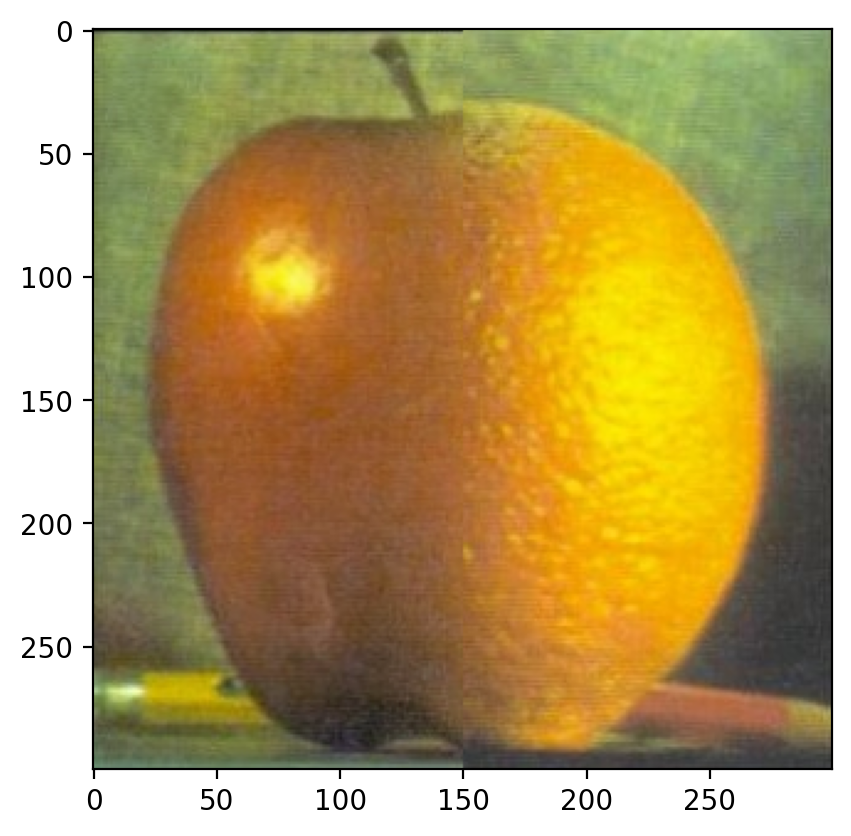

In [77]:
merge = merge * 255
result = np.clip(merge, 0, 255).astype(np.uint8)
plt.imshow(result)
plt.savefig("result/part2.4/oraple.jpg")
plt.show()

Multiresolution blending examples

In [103]:
left1 = io.imread("data/self1_left.JPG")/255
right1 = io.imread("data/self1_right.JPG")/255

In [104]:
print(left1.shape)
print(right1.shape)

(393, 478, 3)
(466, 551, 3)


In [105]:
from skimage import transform
right1 = transform.resize(right1, (393, 478))
print(right1.shape)

(393, 478, 3)


In [110]:
l1_G_stack = Gaussian_Stack(left1, 4, 42, 7)
r1_G_stack = Gaussian_Stack(right1, 4, 42, 7)

l1_L_stack = Laplacian_Stack(left1, 4, 42, 7)
r1_L_stack = Laplacian_Stack(right1, 4, 42, 7)

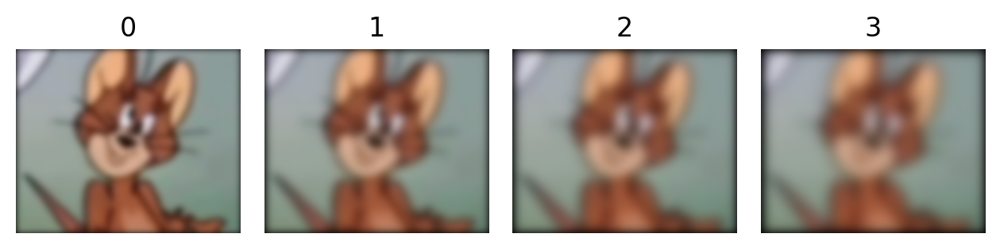

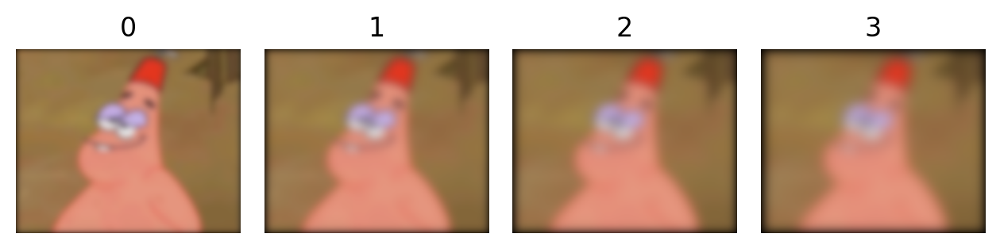

In [111]:
Show_Stack(l1_G_stack)
Show_Stack(r1_G_stack)

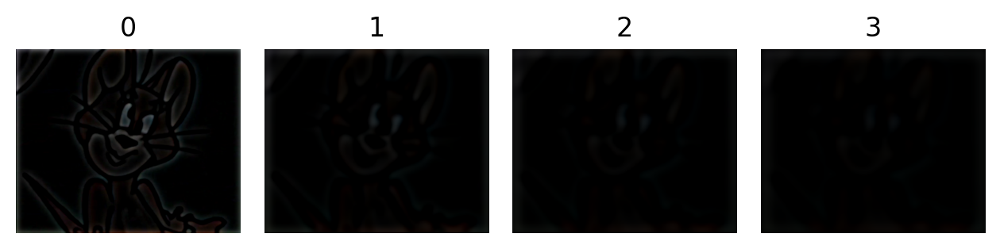

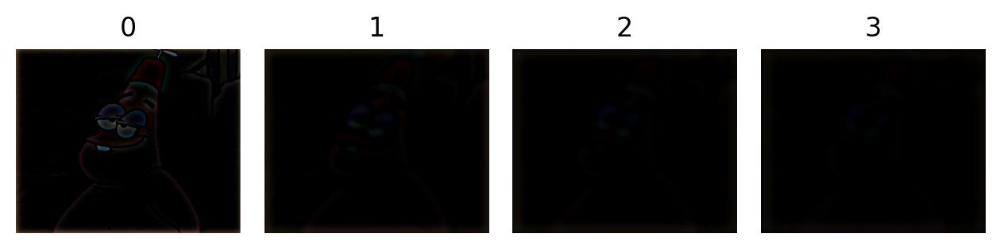

In [112]:
Show_Stack(l1_L_stack)
Show_Stack(r1_L_stack)

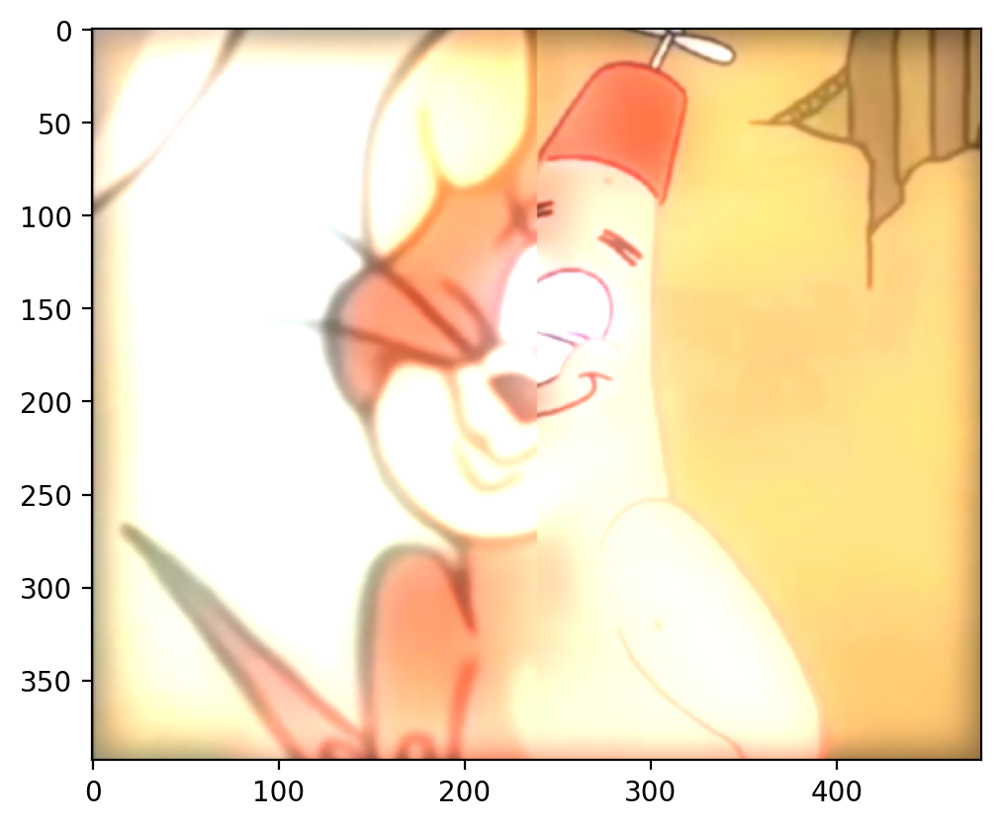

In [115]:
merge1 = merge_stack(l1_G_stack, l1_L_stack, r1_G_stack, r1_L_stack)

merge1 = merge1 * 255
result1 = np.clip(merge1, 0, 255).astype(np.uint8)
plt.imshow(result1)
plt.savefig("result/part2.4/result1.jpg")
plt.show()